In [1]:
from transformers import pipeline
import torch
from accelerate.test_utils.testing import get_backend
device, _, _ = get_backend()
checkpoint = "depth-anything/Depth-Anything-V2-base-hf"
pipe = pipeline("depth-estimation", model=checkpoint, device=device)

Device set to use cuda


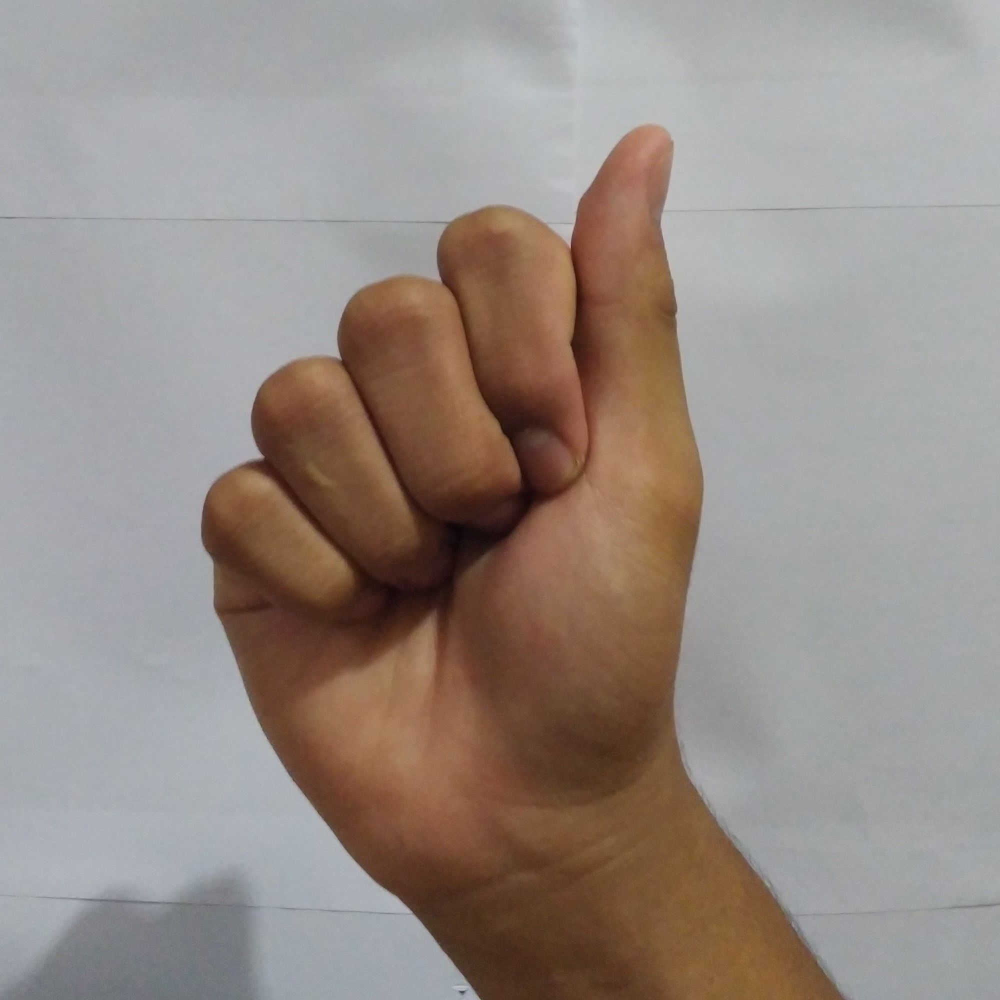

In [31]:
from PIL import Image
import requests

url = "../../../dataset/SIBI/SIBI_datasets_LEMLITBANG_SIBI_R_90.10_RAW/SIBI_datasets_LEMLITBANG_SIBI_R_90.10_RAW/training/A/A (1) - Copy - Copy - Copy.jpg"
# image = Image.open(requests.get(url, stream=True).raw)
image = Image.open(url)
image

In [ ]:
import matplotlib as plt
predictions = pipe(image)
print(predictions['predicted_depth'].shape)
# plt.imshow(predictions['predicted_depth'])
# plt.show()




torch.Size([2000, 2000])


AttributeError: 'Image' object has no attribute 'shape'

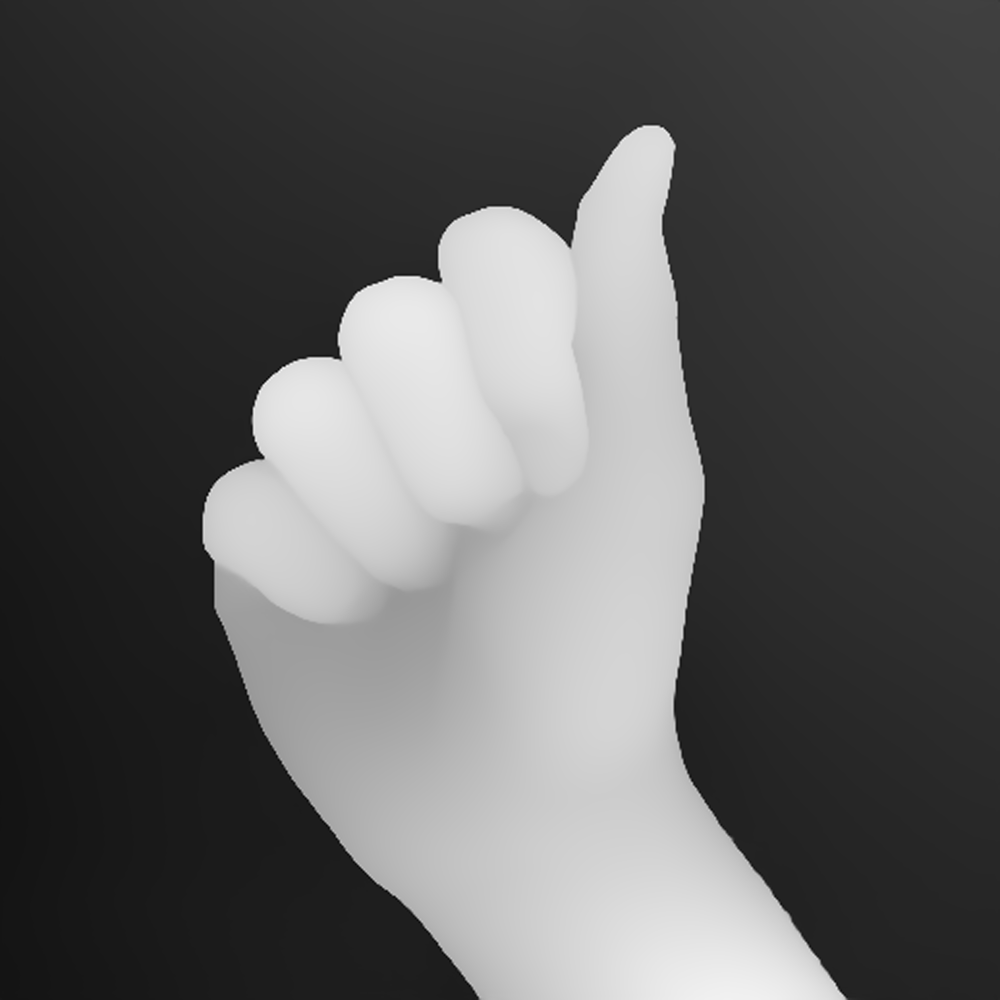

In [34]:
predictions['depth']

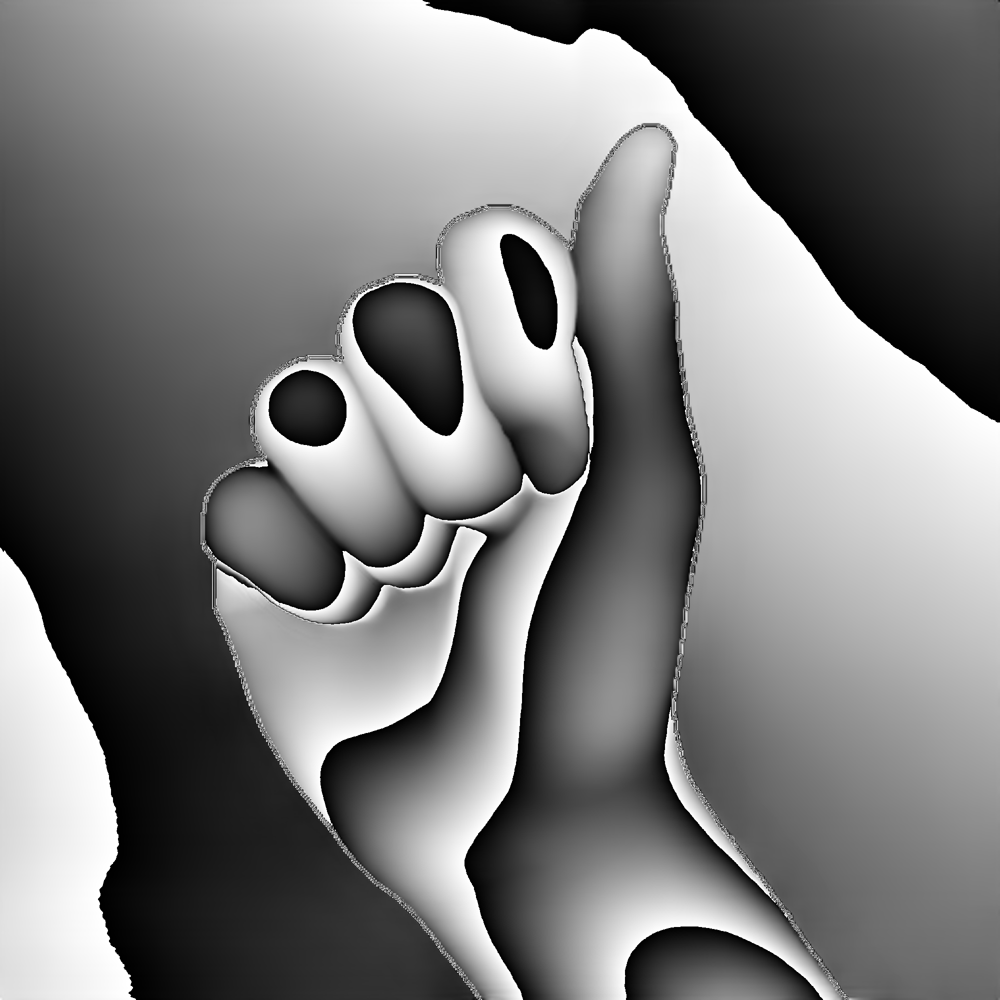

In [41]:
import torchvision.transforms.functional as pil_torch
b = predictions['predicted_depth']
b = b.unsqueeze(0)
bpil = pil_torch.to_pil_image(b)
bpil

torch.Size([1, 2000, 2000])


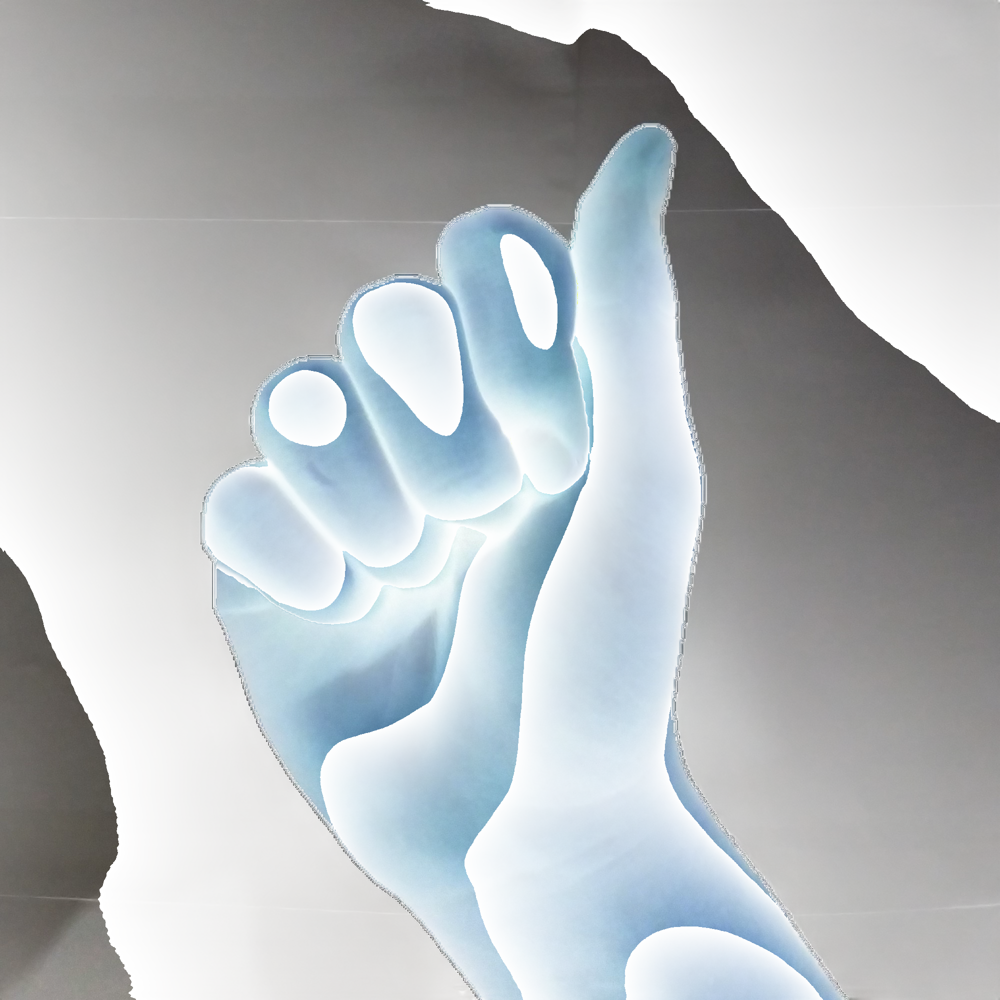

In [35]:
import torchvision.transforms.functional as pil_torch
from PIL import Image



a = pil_torch.pil_to_tensor(image)
c = torch.cat((a,b), dim=0)
imbaru = pil_torch.to_pil_image(c)
imbaru


In [42]:
d = pil_torch.pil_to_tensor(predictions['depth'])
print(d.shape)
e = torch.cat((b,d), dim=0)
eim = pil_torch.

torch.Size([1, 2000, 2000])


tensor([[[ 1.5154,  1.5154,  1.5155,  ...,  2.1544,  2.1017,  2.0897],
         [ 1.5146,  1.5146,  1.5148,  ...,  2.1641,  2.1137,  2.1022],
         [ 1.5110,  1.5111,  1.5114,  ...,  2.2057,  2.1655,  2.1564],
         ...,
         [ 0.9481,  0.9452,  0.9327,  ...,  1.4516,  1.4682,  1.4720],
         [ 0.9635,  0.9600,  0.9447,  ...,  1.4597,  1.4794,  1.4839],
         [ 0.9670,  0.9634,  0.9475,  ...,  1.4616,  1.4820,  1.4867]],

        [[39.0000, 39.0000, 39.0000,  ..., 57.0000, 55.0000, 55.0000],
         [39.0000, 39.0000, 39.0000,  ..., 57.0000, 56.0000, 55.0000],
         [38.0000, 38.0000, 38.0000,  ..., 58.0000, 57.0000, 57.0000],
         ...,
         [22.0000, 22.0000, 22.0000,  ..., 37.0000, 37.0000, 37.0000],
         [23.0000, 23.0000, 22.0000,  ..., 37.0000, 38.0000, 38.0000],
         [23.0000, 23.0000, 22.0000,  ..., 37.0000, 38.0000, 38.0000]]])